In [2]:
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

In [3]:
from dmp.dmp import DMPs_cartesian
from dmp.obstacle_superquadric import Obstacle_Dynamic as sq_dyn

In [4]:
from DMP_map_Rotation import rotation_matrix_from_vectors, tra_map_param, tra_map_forward, tra_map_inverse
from Minimal_Ellipsoid import rotate_ellipsoid, draw_ellipsoid

Rotation Matrix R:
 [[-1.0000000e+00  0.0000000e+00  1.2246468e-16]
 [ 0.0000000e+00  1.0000000e+00  0.0000000e+00]
 [-1.2246468e-16  0.0000000e+00 -1.0000000e+00]]
inverse map [ 1.2246468e-16  0.0000000e+00 -1.0000000e+00]
tra_new: [[ 0.          0.          0.        ]
 [ 0.0849818   0.08761927  0.56376256]
 [-0.16894332  0.14912292  0.29254768]
 [ 1.          1.          1.        ]]
tra_origin [[ 0.00000000e+00  0.00000000e+00  0.00000000e+00]
 [ 1.20000000e+00  1.00000000e+00 -7.04245728e-16]
 [ 1.00000000e+00 -1.18511224e-16 -2.29970687e-16]
 [ 2.00000000e+00  3.00000000e+00  3.00000000e+00]]
tra_origin_element [ 1.20000000e+00  1.00000000e+00 -7.21644966e-16]


In [5]:
# Trajectory 1
# goal_move_to_peg = np.array([0.488574563751,
#                             -0.184923096437,
#                             0.262908357465])

# goal_move_to_ring = np.array([0.505577739181,
#                               0.310174815877,
#                               0.045214734967])

# x0_move_to_peg = goal_move_to_ring

# x0_move_to_ring = np.array([0.307, 0, 0.483])



In [6]:
# #DMP Ini
# K=1050.0
# alpha_s = 4.0
# tol=0.01

# MP = DMPs_cartesian(K=K, alpha_s=alpha_s, tol=tol)

In [7]:
# #DMP evolution
# MP.x_0=x0_move_to_ring
# MP.x_goal=goal_move_to_ring
# MP.reset_state()
# x_track_static_toring = np.array([MP.x_0])
# flag_conv = False
# while not flag_conv:
#     MP.step()
#     x_track_static_toring = np.append(x_track_static_toring, np.array([MP.x]), axis=0)
#     flag_conv = np.linalg.norm(MP.x - MP.x_goal) < MP.tol

In [8]:
# #DMP 3D plot
# fig=plt.figure()
# ax = fig.add_subplot(111, projection='3d')
# ax.plot(x_track_static_toring[:, 0], x_track_static_toring[:, 1], x_track_static_toring[:, 2],'-k', linewidth=1.5)

In [9]:
# Trajectory 2
# Trajectory
t_des = np.linspace(0.0, 1.0, 1000)
gamma = np.transpose(
    [np.cos(np.pi * t_des),
    np.sin(np.pi * t_des),
    t_des * 0.5])

# gamma2 = np.transpose(
#     [np.cos(np.pi * t_des),
#     1-np.sin(np.pi * t_des),
#     t_des * 0.5])

# gamma2 = np.transpose(
#     [np.cos(np.pi * t_des),
#     1-0.2*np.sin(np.pi * t_des),
#     t_des * 0.5])

gamma2 = np.transpose(
    [np.cos(np.pi * t_des),
    1-0*t_des,
    t_des * 0.5])


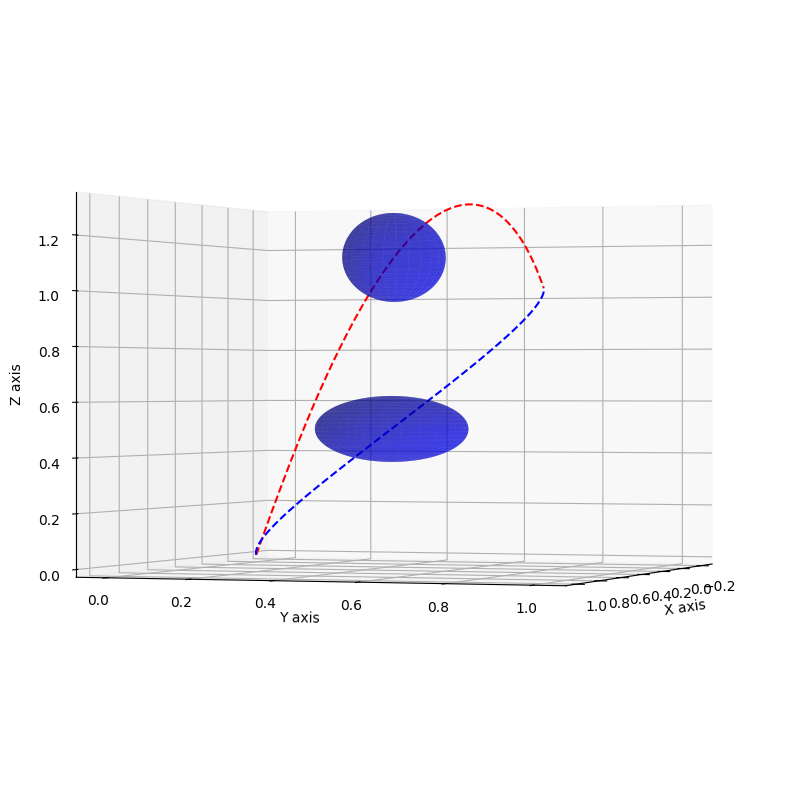

In [10]:
alpha1,T1,R1=tra_map_param(gamma)
gamma_map=tra_map_forward(gamma, alpha1, T1, R1)

alpha2,T2,R2=tra_map_param(gamma2)
gamma2_map=tra_map_forward(gamma2, alpha2, T2, R2)

center_e1=np.array([0.0,1.0,0.25])
axes_e1=np.array([0.2,0.1,0.15])

center_e2=np.array([0.0,1.0,0.25])
axes_e2=np.array([0.2,0.1,0.15])

center_e1_,axes_e1_,points1=rotate_ellipsoid(center_e1, axes_e1, alpha1,T1, R1)
center_e2_,axes_e2_,points2=rotate_ellipsoid(center_e2, axes_e2, alpha2,T2, R2)

fig=plt.figure(figsize=(10, 10))
ax = fig.add_subplot(111, projection='3d')
ax.plot(gamma_map[:, 0], gamma_map[:, 1], gamma_map[:, 2],'--r', linewidth=1.5)
ax.plot(gamma2_map[:, 0], gamma2_map[:, 1], gamma2_map[:, 2],'--b', linewidth=1.5)

draw_ellipsoid(ax, center_e1_, axes_e1_, num_points=100, color='b', alpha=0.5)
draw_ellipsoid(ax, center_e2_, axes_e2_, num_points=100, color='b', alpha=0.5)

ax.set_xlabel('X axis')
ax.set_ylabel('Y axis')
ax.set_zlabel('Z axis')

ax.view_init(elev=0, azim=20)





In [11]:
print(center_e1_)
print(center_e2_)

(-0.007661364448821852, 0.3542665715056622, 1.1533947670045217)
(0.5000012629849769, 0.4999987046933981, 0.5000000111440152)


In [12]:
#DMP Ini
K=1050.0
alpha_s = 4.0
tol=0.01
dt=0.01

MP = DMPs_cartesian(K=K, alpha_s=alpha_s, tol=tol)
MP2= DMPs_cartesian(K=K, alpha_s=alpha_s, tol=tol)

In [13]:
#DMP try
# MP.imitate_path(t_des=t_des, x_des=gamma)
# MP2.imitate_path(t_des=t_des, x_des=gamma2)

MP.imitate_path(t_des=t_des, x_des=gamma_map)
MP2.imitate_path(t_des=t_des, x_des=gamma2_map)

gamma_, _, _, _ = MP.rollout()
gamma2_, _, _, _ = MP2.rollout()
t_des_ = np.linspace(0.0, 1.0, np.shape(gamma)[0])

In [14]:
# Plot Ellipsoid
# Define the ellipsoid parameters
a = 0.2  # Semi-axis length in the x-direction
b = 0.1  # Semi-axis length in the y-direction
c = 0.15  # Semi-axis length in the z-direction

# Create a grid of values for theta and phi
theta = np.linspace(0, 2 * np.pi, 20)
phi = np.linspace(0, np.pi, 10)
theta, phi = np.meshgrid(theta, phi)

# Parametric equations for the ellipsoid
x = a * np.sin(phi) * np.cos(theta) + 0.0
y = b * np.sin(phi) * np.sin(theta) + 1.0
z = c * np.cos(phi) + 0.25

In [15]:
MP.x_0 = gamma_[0]
MP.x_goal = gamma_[-1]

MP2.x_0 = gamma2_[0]
MP2.x_goal = gamma2_[-1]

MP.reset_state()
MP2.reset_state()
gamma_tra = np.array([gamma[0]])
gamma2_tra= np.array([gamma2[0]])

In [16]:
dyn_lambda = 6.74
dyn_eta = 1.14
dyn_beta = 0.55

# obstacle
center_e=np.array([0.0,1.0,0.25])
axes_e=np.array([0.2,0.1,0.15])
v_e = np.array([0.0,0.0,0.0])

#agent world coordinates
center_agent1=np.array(MP.x_0)
center_agent2=np.array(MP2.x_0)

# map ellipsoid obstacle to local coordinates
center_e1_map,axes_e1_map,_=rotate_ellipsoid(center_e, axes_e, alpha1,T1, R1)
center_e2_map,axes_e2_map,_=rotate_ellipsoid(center_e, axes_e, alpha2,T2, R2)


#map agent back to the original world coordination
center_agent1_origin=tra_map_inverse(center_agent1, alpha1, T1, R1)
center_agent2_origin=tra_map_inverse(center_agent2, alpha2, T2, R2)

#map agent to their corresponding world coordination
center_agent1_map=tra_map_forward(center_agent1_origin,alpha2, T2, R2)
center_agent2_map=tra_map_forward(center_agent2_origin,alpha1, T1, R1)


axes_agent=np.array([0.05,0.05,0.05])

v_agent1=np.array([0.0,0.0,0.0])
v_agent2=np.array([0.0,0.0,0.0])




agent1_obst_dynamic = sq_dyn(center=center_e1_map, axis=axes_e1_map, coeffs=np.array([1,1,1]), lmbda=dyn_lambda, beta=dyn_beta, eta=dyn_eta)
agent2_obst_dynamic = sq_dyn(center=center_e2_map, axis=axes_e2_map, coeffs=np.array([1,1,1]), lmbda=dyn_lambda, beta=dyn_beta, eta=dyn_eta)
agent1_dynamic= sq_dyn(center=center_agent2, axis=alpha1*axes_agent, coeffs=np.array([1,1,1]), lmbda=dyn_lambda, beta=dyn_beta, eta=dyn_eta)
agent2_dynamic= sq_dyn(center=center_agent1, axis=alpha2*axes_agent, coeffs=np.array([1,1,1]), lmbda=dyn_lambda, beta=dyn_beta, eta=dyn_eta)



In [17]:
def perturb_dynamic_agent1(x, v):
    out = agent1_obst_dynamic.gen_external_force(x, v-v_e)+\
    agent1_dynamic.gen_external_force(x,v-v_agent2)
    # print(out)
    return out

In [18]:
def perturb_dynamic_agent2(x, v):
    out = agent2_obst_dynamic.gen_external_force(x, v-v_e)+\
    agent2_dynamic.gen_external_force(x,v-v_agent1)
    return out

In [19]:
#DMP 3D plot
def plotresult():
    fig=plt.figure(figsize=(10, 10))
    ax = fig.add_subplot(111, projection='3d')
    ax.plot(gamma[:, 0], gamma[:, 1], gamma[:, 2],'--k', linewidth=1.5)
    ax.plot(gamma2[:, 0], gamma2[:, 1], gamma2[:, 2],'--k', linewidth=1.5)
    # ax.plot(gamma[:, 0], gamma[:, 1], gamma[:, 2],'-g', linewidth=1.5)
    ax.plot(gamma_tra[:, 0], gamma_tra[:, 1], gamma_tra[:, 2],'-r', linewidth=1.5)
    ax.plot(gamma2_tra[:, 0], gamma2_tra[:, 1], gamma2_tra[:, 2],'-r', linewidth=1.5)
    ax.plot_surface(x, y, z, color='b', alpha=0.3, edgecolor=(0, 0, 0, 0.1))  # Use alpha for transparency
    # ax.plot_surface(x_, y_, z_, color='r', alpha=0.3, edgecolor=(0, 0, 0, 0.1))  # Use alpha for transparency
    
    ax.set_xlabel('X axis')
    ax.set_ylabel('Y axis')
    ax.set_zlabel('Z axis')
    
    ax.view_init(elev=10, azim=20)
    
    # Manually adjust the subplot margins
    plt.subplots_adjust(left=0.1, right=0.9, top=0.9, bottom=0.1)
    plt.draw()         # Redraw the current figure
    plt.pause(0.1) 

/home/siddharth/Research/Dual_Arm/DMP-python20240929/dmp/obstacle_superquadric.py:121: RuntimeWarning: invalid value encountered in scalar divide
  cos_theta = np.dot(nabla, v) / np.linalg.norm(v) / np.linalg.norm(nabla)
/home/siddharth/Research/Dual_Arm/DMP-python20240929/dmp/obstacle_superquadric.py:146: RuntimeWarning: invalid value encountered in divide
  nabla_norm_nabla_C /= norm_nabla_C
/home/siddharth/Research/Dual_Arm/DMP-python20240929/dmp/obstacle_superquadric.py:152: RuntimeWarning: invalid value encountered in scalar power
  C_x ** (- self.eta) * \
/home/siddharth/Research/Dual_Arm/DMP-python20240929/dmp/obstacle_superquadric.py:151: RuntimeWarning: invalid value encountered in scalar power
  phi = - self.lmbda * norm_v * (-cos_theta) ** (self.beta - 1.0) * \


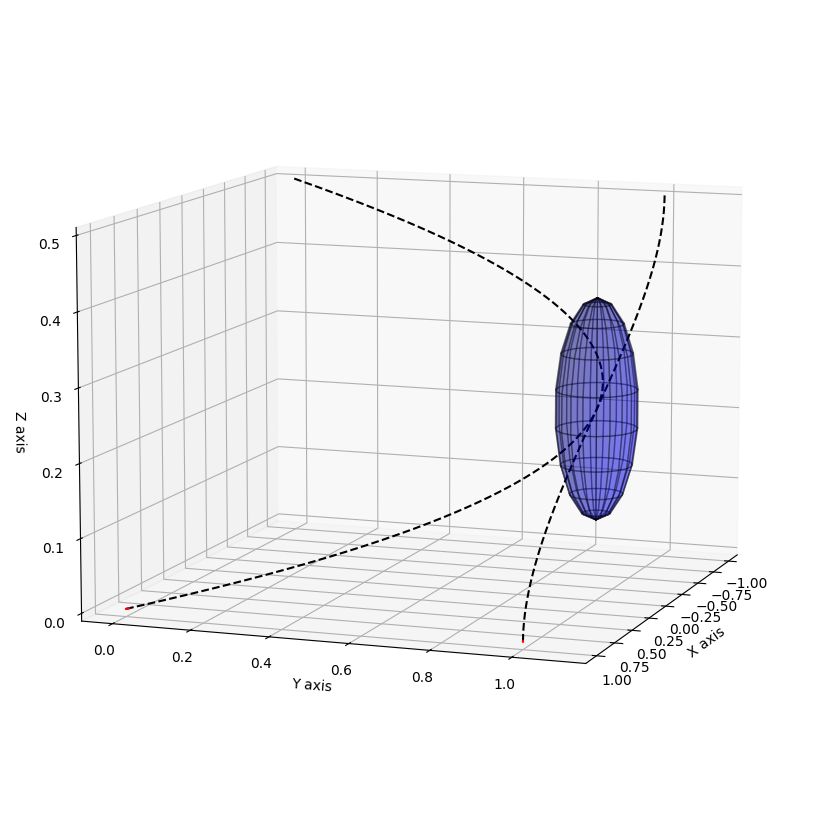

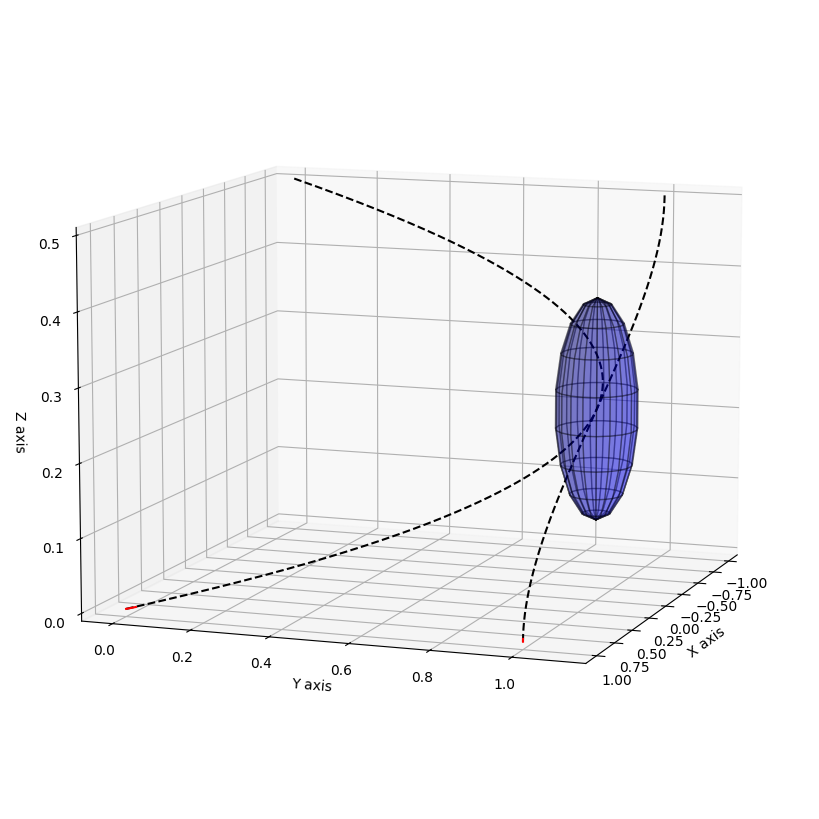

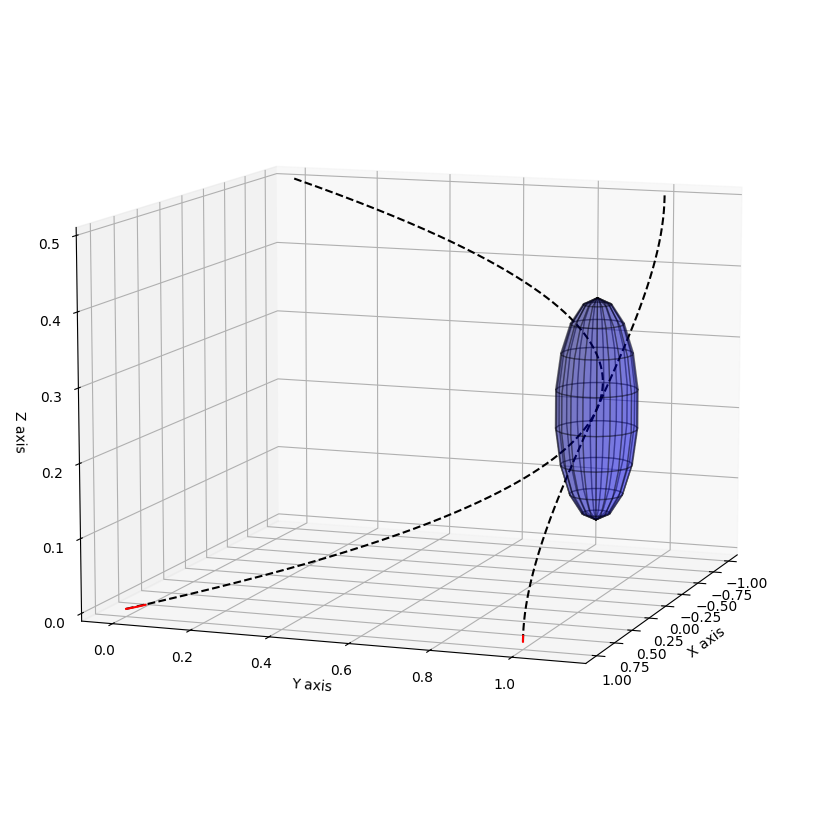

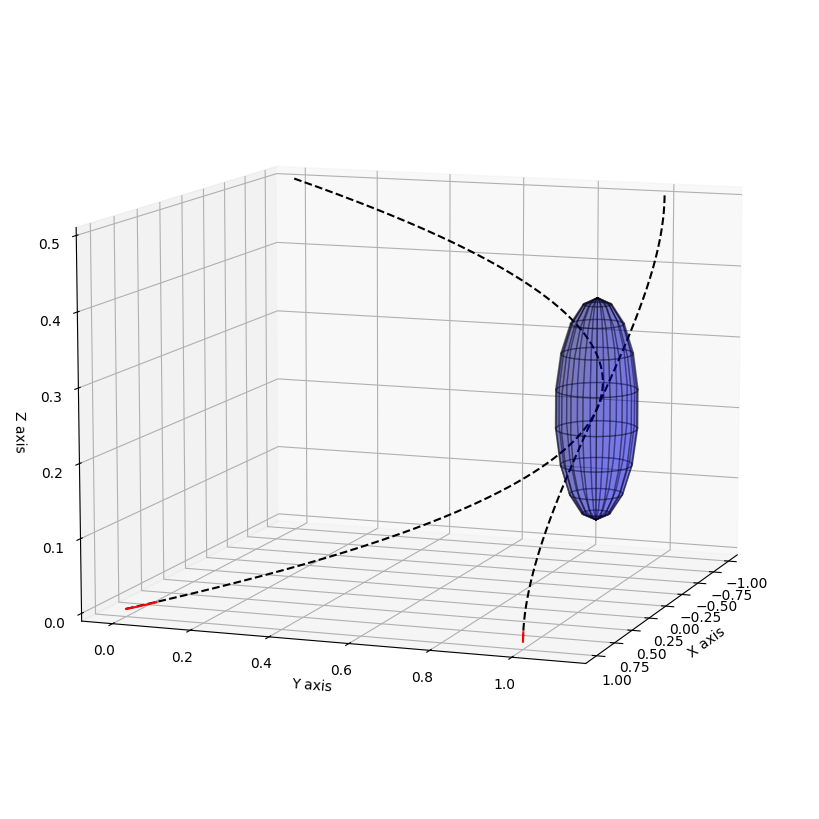

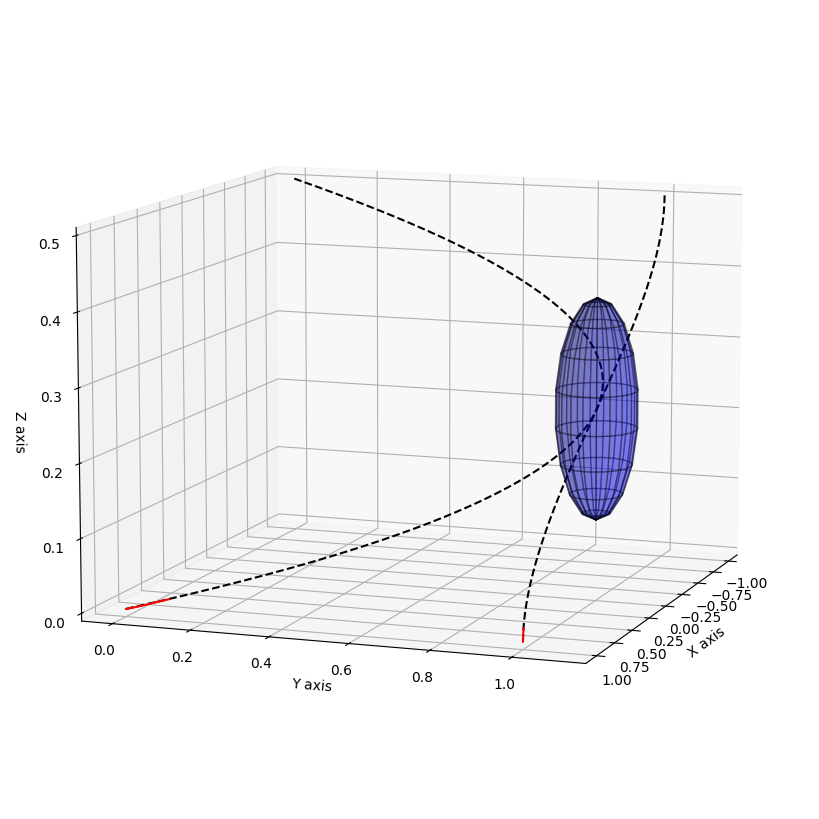

...

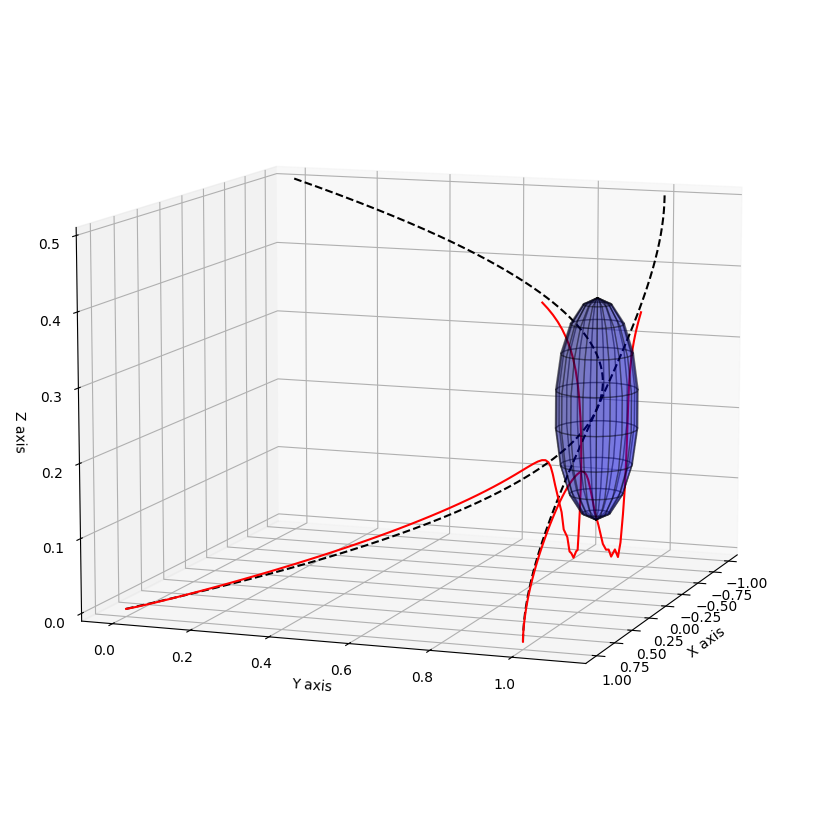

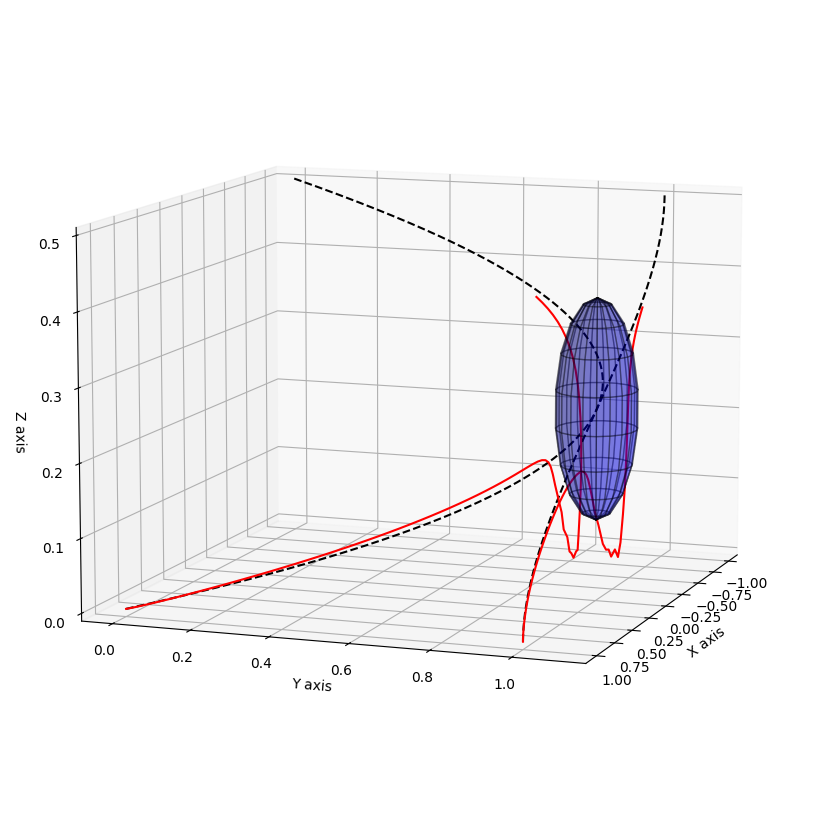

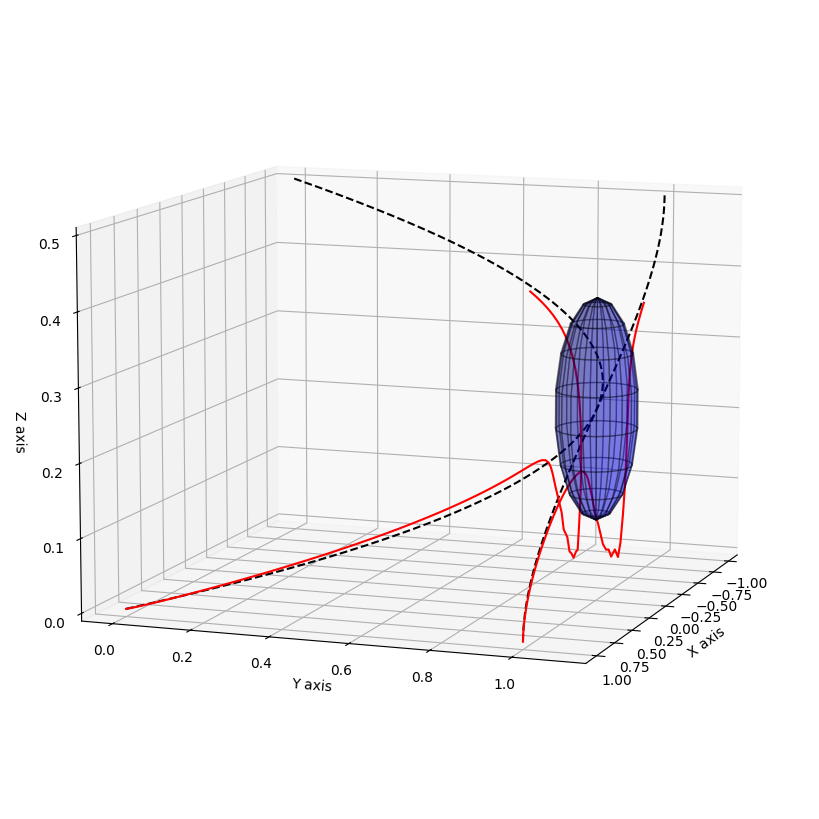

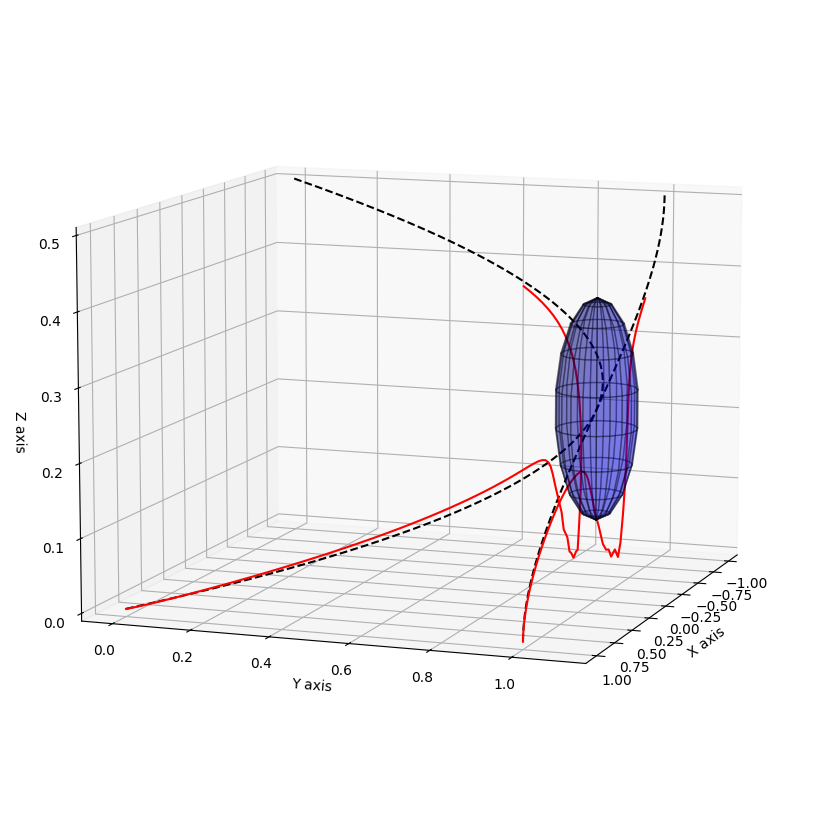

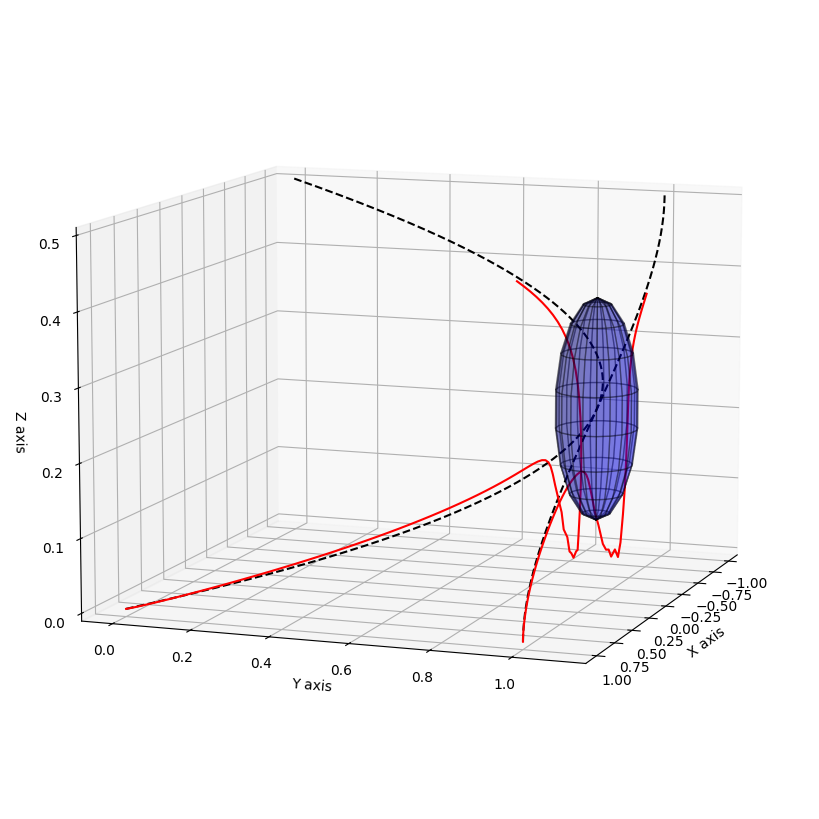

KeyboardInterrupt: 

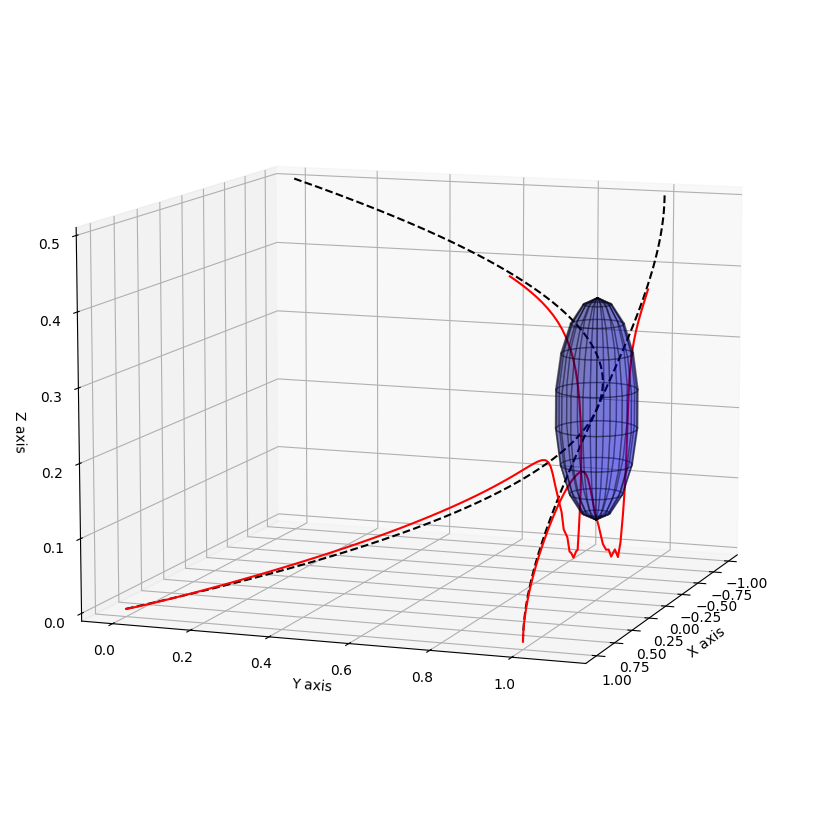

In [20]:
plt.ion()

flag_conv = False
flag_conv2 = False
total_time=0

while not (flag_conv and flag_conv2):
    # obst_dynamic.center=obst_dynamic.center+v_e*dt
    total_time += dt
    
    # close_flag= np.linalg.norm(MP.x - MP2.x)>0.2
    close_flag=True

        # Parametric equations for the ellipsoid
    # x_ = a * np.sin(phi) * np.cos(theta) + obst_dynamic.center[0]
    # y_ = b * np.sin(phi) * np.sin(theta) + obst_dynamic.center[1]
    # z_ = c * np.cos(phi) + obst_dynamic.center[2]


    
    

    if not close_flag:
        print("agent1 stop")

    if (not flag_conv) and close_flag:
        # apply potential field
        MP.step(external_force=perturb_dynamic_agent1)
        flag_conv = np.linalg.norm(MP.x - MP.x_goal) < MP.tol
        # Map coordinations
        center_agent1_origin=tra_map_inverse(np.array(MP.x), alpha1, T1, R1)
        center_agent1_map=tra_map_forward(center_agent1_origin,alpha2, T2, R2)
        agent2_dynamic.center=center_agent1_map

        # print(R1.T@ (np.array(MP.dx)/alpha1).T)
        # print(R1.T@ (np.array(MP.dx)/alpha1).T)
    
        v_agent1=alpha2*R2@(R1.T@ (np.array(MP.dx)/alpha1).T)
        v_agent1=v_agent1.T
    

        #store trajecory in world map
        gamma_tra = np.append(gamma_tra, np.array([center_agent1_origin]), axis=0)
        # print(gamma_tra)


    

    

    if not flag_conv2:
        # apply potential field
        MP2.step(external_force=perturb_dynamic_agent2)
        flag_conv2 = np.linalg.norm(MP2.x - MP2.x_goal) < MP2.tol
        # Map coordinations
        center_agent2_origin=tra_map_inverse(np.array(MP2.x), alpha2, T2, R2)
        center_agent2_map=tra_map_forward(center_agent2_origin,alpha1, T1, R1)
        agent1_dynamic.center=center_agent2_map
    
        v_agent2=alpha1*R1@(R2.T@ (np.array(MP2.dx)/alpha2).T)
        v_agent2=v_agent2.T
        #store trajecory in world map
        gamma2_tra = np.append(gamma2_tra, np.array([center_agent2_origin]), axis=0)
        # print(gamma2_tra)


    if flag_conv:
        print("agent1 achieve goal")

    if flag_conv2:
        print("agent2 achieve goal")
    
    plotresult()


print(total_time)
    

In [ ]:
gamma_[-1]

In [ ]:
gamma_tra[-1]

In [ ]:
def my_function():
    print(v_e)

In [ ]:
for i in range(5):
    my_function()
    v_e=v_e+1

In [ ]:
A=np.array([1,2])
B=np.array([A])

In [ ]:
print(A)
print(B)

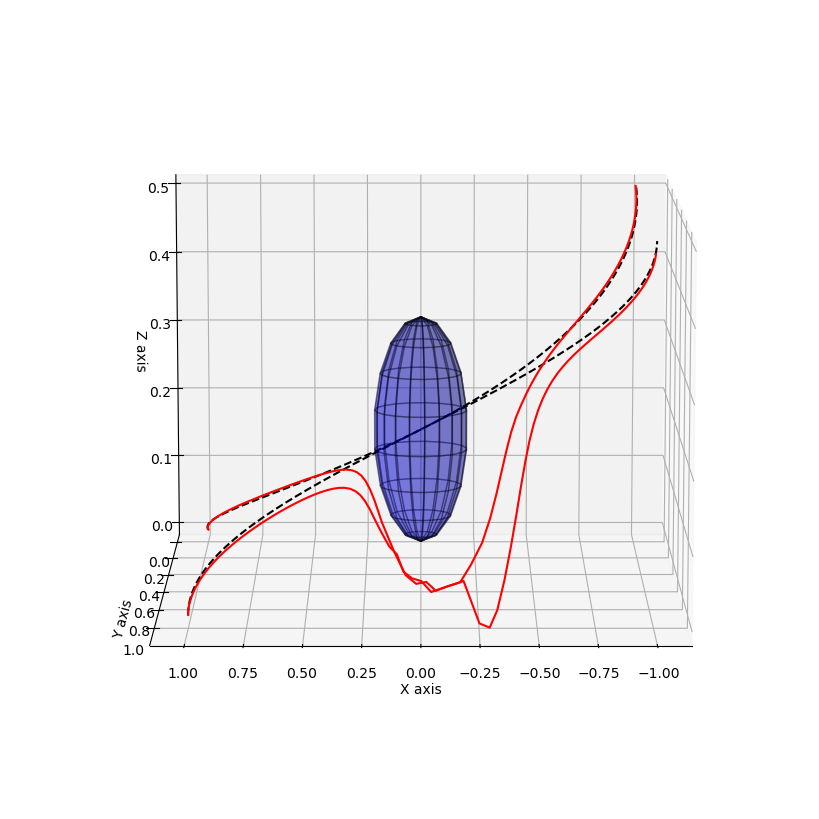

In [ ]:
    fig=plt.figure(figsize=(10, 10))
    ax = fig.add_subplot(111, projection='3d')
    ax.plot(gamma[:, 0], gamma[:, 1], gamma[:, 2],'--k', linewidth=1.5)
    ax.plot(gamma2[:, 0], gamma2[:, 1], gamma2[:, 2],'--k', linewidth=1.5)
    # ax.plot(gamma[:, 0], gamma[:, 1], gamma[:, 2],'-g', linewidth=1.5)
    ax.plot(gamma_tra[:, 0], gamma_tra[:, 1], gamma_tra[:, 2],'-r', linewidth=1.5)
    ax.plot(gamma2_tra[:, 0], gamma2_tra[:, 1], gamma2_tra[:, 2],'-r', linewidth=1.5)
    ax.plot_surface(x, y, z, color='b', alpha=0.3, edgecolor=(0, 0, 0, 0.1))  # Use alpha for transparency
    # ax.plot_surface(x_, y_, z_, color='r', alpha=0.3, edgecolor=(0, 0, 0, 0.1))  # Use alpha for transparency
    
    ax.set_xlabel('X axis')
    ax.set_ylabel('Y axis')
    ax.set_zlabel('Z axis')
    
    ax.view_init(elev=10, azim=90)
    
    # Manually adjust the subplot margins
    plt.subplots_adjust(left=0.1, right=0.9, top=0.9, bottom=0.1)
    plt.draw()         # Redraw the current figure
    plt.pause(0.1) 

In [ ]:
print(flag_conv)
print(flag_conv2)

In [ ]:
gamma_tra[-1]

In [ ]:
if False:
    print("hello")

In [ ]:
A=np.array([1,2,3])
print(A.ndim)
A.reshape(1,-1)

In [ ]:
A

In [ ]:
np.array([-1,-1,1])+np.array([[0,0,0],[1,1,100]])